<a href="https://colab.research.google.com/github/devanshishah2023-del/animal_images_classification/blob/main/animal_images_classification_OPTIMIZED.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# ============================================
# INSTALL PyTorch + Fix Sympy (All-in-One)
# ============================================
import subprocess
import sys

print("Installing PyTorch and dependencies...")
print("This will take ~30-60 seconds...\n")

# Install PyTorch with CUDA support (for Google Colab)
result = subprocess.run([
    sys.executable, '-m', 'pip', 'install',
    'torch', 'torchvision', 'torchaudio',
    '--upgrade'
], capture_output=True, text=True)

if result.returncode != 0:
    print("Error installing PyTorch:")
    print(result.stderr)
else:
    print("✓ PyTorch installed successfully")

# Install compatible sympy
subprocess.run([sys.executable, '-m', 'pip', 'install', '-q', '--upgrade', 'sympy'],
              capture_output=True)

print("\n✓ All packages installed!")
print("="*60)
print("RESTART RUNTIME NOW")
print("="*60)
print("Click: Runtime → Restart runtime")
print("Then run the next cell with imports")
print("="*60)

Installing PyTorch and dependencies...
This will take ~30-60 seconds...

✓ PyTorch installed successfully

✓ All packages installed!
⚠️  RESTART RUNTIME NOW
Click: Runtime → Restart runtime
Then run the next cell with imports


In [3]:
!pip install torch torchvision torchaudio --upgrade

In [4]:
# ============================================
# IMPORTS - Corrected
# ============================================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

import torch
import torchvision  # Import this first
from torch.utils.data import Dataset
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision import models
from sklearn import preprocessing

import os
import time
import copy
from tqdm.notebook import trange, tqdm



In [5]:
pwd

'/content'

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
ls

drive/  sample_data/


In [8]:
cd drive

/content/drive


In [9]:
cd MyDrive

/content/drive/MyDrive


In [10]:
ls

'_0_Guest Houses as on 01.08.2019.xlsx'
'1 (1).JPG'
"12200 ANZSCO Version 1.2 - What's New.xls"
'12th_marksheet (1).pdf'
'12th_marksheet (2).pdf'
 1637771652php5c6IeI.pdf
 1674049660301.pdf
 1676342748312.docx
 1676342748312.jpeg
 1689702452phpIV0c7G.pdf
 1704711936.doc
'1901610100054 (1).pdf'
 1901610100054.pdf
'19- Creating APIs.vtt'
'1ByAtE (1).pdf'
 1ByAtE.pdf
 1.JPG
'1st year marksheet (1) (1).jpeg'
'1st year marksheet (1).jpeg'
'1st year marksheet (2) (1).jpeg'
'1st year marksheet (2).jpeg'
'1st year marksheet (3) (1).jpeg'
'1st year marksheet (3).jpeg'
'1st year marksheet (4).jpeg'
'1st year marksheet.jpeg'
'1st year marksheet.pdf'
'1year_marksheet (1).pdf'
'1year_marksheet (2).pdf'
 1year_marksheet.pdf
 20230303_175130.jpeg
 22122800002399FDRL_ChallanReceipt.pdf
 2.JPG
 2nd_semster.pdf
'2nd year marksheet (1).pdf'
'2nd year marksheet (2).pdf'
'2nd year marksheet.pdf'
'2nd_year_page-0001 (1).jpeg'
 2nd_year_page-0001.jpeg
 3c63baf4-13ad-4db5-aaba-1739749dbf9810th_marksheet.pdf
 

In [11]:
path = 'animals/'

with open(path + "/name of the animals.txt") as f:
    classes = f.read().split('\n')

# View classes
num_classes = len(classes)
print(f'Number of classes: {num_classes}')
print(f'Classes of animals: {" , ".join(classes)}')

Number of classes: 90
Classes of animals: antelope , badger , bat , bear , bee , beetle , bison , boar , butterfly , cat , caterpillar , chimpanzee , cockroach , cow , coyote , crab , crow , deer , dog , dolphin , donkey , dragonfly , duck , eagle , elephant , flamingo , fly , fox , goat , goldfish , goose , gorilla , grasshopper , hamster , hare , hedgehog , hippopotamus , hornbill , horse , hummingbird , hyena , jellyfish , kangaroo , koala , ladybugs , leopard , lion , lizard , lobster , mosquito , moth , mouse , octopus , okapi , orangutan , otter , owl , ox , oyster , panda , parrot , pelecaniformes , penguin , pig , pigeon , porcupine , possum , raccoon , rat , reindeer , rhinoceros , sandpiper , seahorse , seal , shark , sheep , snake , sparrow , squid , squirrel , starfish , swan , tiger , turkey , turtle , whale , wolf , wombat , woodpecker , zebra


In [12]:
animal_path = path + "/animals/animals"

# See the number of images for each class
for animal in os.listdir(animal_path):
    print(f'Number of {animal} images: {len(os.listdir(animal_path + "/" + animal))}')

Number of goose images: 60
Number of badger images: 60
Number of possum images: 60
Number of shark images: 60
Number of deer images: 60
Number of snake images: 60
Number of lion images: 60
Number of cow images: 60
Number of elephant images: 60
Number of bison images: 60
Number of koala images: 60
Number of bat images: 60
Number of cockroach images: 60
Number of squirrel images: 60
Number of octopus images: 60
Number of swan images: 60
Number of horse images: 60
Number of flamingo images: 60
Number of hedgehog images: 60
Number of ladybugs images: 60
Number of okapi images: 60
Number of kangaroo images: 60
Number of pelecaniformes images: 60
Number of caterpillar images: 60
Number of chimpanzee images: 60
Number of beetle images: 60
Number of woodpecker images: 60
Number of parrot images: 60
Number of oyster images: 60
Number of lizard images: 60
Number of mouse images: 60
Number of wolf images: 60
Number of porcupine images: 60
Number of sandpiper images: 60
Number of hummingbird image

### Split data

In [13]:
def shuffle_data(X, seed):
    if seed:
        np.random.seed(seed)

    idx = np.arange(len(X))
    np.random.shuffle(idx)

    return np.array(X)[idx]


def data_split(animal_path, split_size=0.1):
    """
        Based on split size,
        Each folder is split into training and test sets.

        Returns:
            Shuffled training, validation and test dataset
            Each set is in the form of: ['id.jpg', 'string label of id']
                Example: [['1234.jpg', 'antelope'], ['12312.jpg', 'iguana'] ...]
    """

    X_train, X_val, X_test = [], [], []
    y_train, y_val, y_test = [], [], []

    # For each label
    for animal in os.listdir(animal_path):

        # Extract same label for training, validation, test data
        label = animal

        # Image path for each animal
        image_list = os.listdir(animal_path + "/" + animal)

        # Shuffle images (path)
        shuffled_data = shuffle_data(image_list, seed=None)


        # Get the train, val, test split
        split_i = len(shuffled_data) - int(len(shuffled_data) // (1 / (split_size * 2)))
        split_j = len(shuffled_data) - int(len(shuffled_data) // (1 / split_size))

        # Get training data from train_val_data split[:split_j]
        train_data = shuffled_data[:split_i]

        # Add training data, label to final training data
        X_train.extend(train_data)
        y_train.extend([label] * len(train_data))

        # Get val data and label from train_val_data split[split_j:]
        val_data = shuffled_data[split_i:split_j]

        # Add val data, label to final val data
        X_val.extend(val_data)
        y_val.extend([label] * len(val_data))

        # Get test data from shuffled_data[split_i:]
        test_data = shuffled_data[split_j:]

        # Add test data, label to final val data
        X_test.extend(test_data)
        y_test.extend([label] * len(test_data))


    # Each image is presented as: ['image id.jpg', 'string label']
    training_data = list(zip(X_train, y_train))
    val_data = list(zip(X_val, y_val))
    test_data = list(zip(X_test, y_test))

    #Shuffle all data in respective sets
    shuffled_training_data = shuffle_data(training_data, seed=None)
    shuffled_val_data = shuffle_data(val_data, seed=None)
    shuffled_test_data = shuffle_data(test_data, seed=None)

    return shuffled_training_data, shuffled_val_data, shuffled_test_data

In [14]:
# Split size for training, validation, test
split_size = 0.08

train_data, val_data, test_data = data_split(animal_path, split_size=split_size)
print('Number of training images: {}'.format(len(train_data)))
print('Number of validation images: {}'.format(len(val_data)))
print('Number of testing images: {}'.format(len(test_data)))

Number of training images: 4590
Number of validation images: 450
Number of testing images: 360


In [15]:
def image_plot(data):
    fig = plt.figure(figsize=(20, 6))
    rows = 3
    columns = 10

    ax = []

    # See the first 30 images
    for i in range(30):
        image, label = data[i]

        ax.append(fig.add_subplot(rows, columns, i+1))

        if torch.is_tensor(image):
            image = image.permute(1, 2, 0)
            ax[-1].set_title(le.inverse_transform([label])[0], fontsize=12, fontweight='bold')
        else:
            image_path =  os.path.join(animal_path + "/" + label + "/" + image)
            image = mpimg.imread(image_path)
            ax[-1].set_title(label, fontsize=12, fontweight='bold')

        plt.imshow(image)
        plt.axis('off')

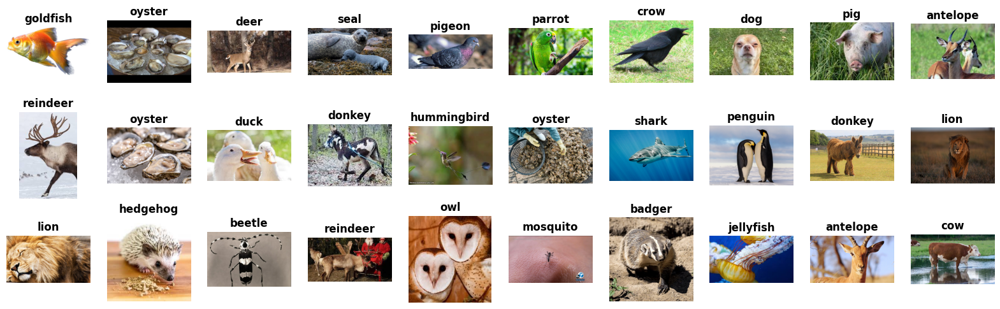

In [16]:
# See some of the training images before pre-processing
image_plot(train_data)

### Dataset preparation and Label Encoding

In [17]:
# To convert string labels into integers
le = preprocessing.LabelEncoder()
le.fit(classes)

LabelEncoder()

In [18]:
class _Dataset(Dataset):

    def __init__(self, data, transform=None):
        data, label = zip(*data)

        # Transform string labels into integers
        label = le.transform(label)

        self.x = np.array(data)
        self.y = np.array(label)
        self.num_samples = len(data)
        self.transform = transform

    def __getitem__(self, index):
        sample = self.x[index], self.y[index]
        img_path = os.path.join(animal_path, le.inverse_transform([sample[1]])[0], sample[0])
        img = mpimg.imread(img_path)

        if self.transform:

            features = self.transform(img)

        return features, sample[1]

    def __len__(self):
        return self.num_samples

data_transforms = {
    'train': transforms.Compose(
        [transforms.ToPILImage(),
         transforms.Resize(256),
         transforms.RandomCrop(224),
         transforms.RandomHorizontalFlip(p=0.5),
         transforms.GaussianBlur(3),
         transforms.ColorJitter(0.5),
         transforms.RandomRotation(15),
         transforms.ToTensor(),
         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
    'val': transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}


In [19]:
training_dataset = _Dataset(train_data, transform=data_transforms['train'])
validation_dataset = _Dataset(val_data, transform=data_transforms['val'])
test_dataset = _Dataset(test_data, transform=data_transforms['val'])

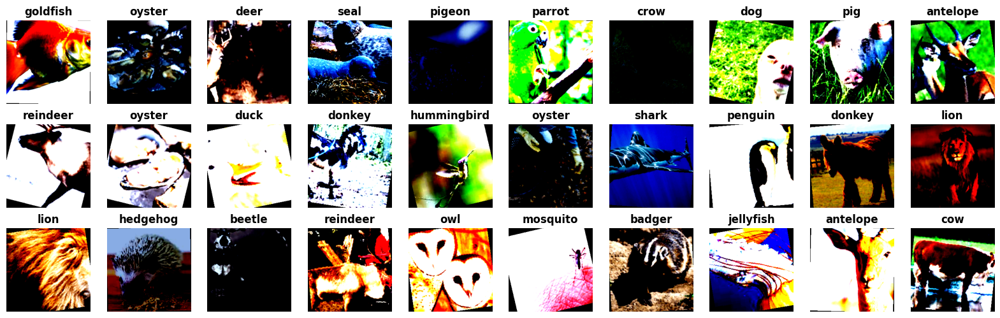

In [20]:
# Visualise augmented ugly images
image_plot(training_dataset)

In [21]:
BATCH_SIZE=32

train_loader = torch.utils.data.DataLoader(dataset=training_dataset, shuffle=True, batch_size=BATCH_SIZE)
val_loader = torch.utils.data.DataLoader(dataset=validation_dataset, shuffle=False, batch_size=BATCH_SIZE)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, shuffle=False, batch_size=BATCH_SIZE)

### Model

In [22]:

class EarlyStopping():
    """
    Early stopping to stop the training when the loss does not improve after
    certain epochs.
    """
    def __init__(self, patience=5, min_delta=0):
        """
        :param patience: how many epochs to wait before stopping when loss is
               not improving
        :param min_delta: minimum difference between new loss and old loss for
               new loss to be considered as an improvement
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False


    def __call__(self, val_loss):
        if self.best_loss == None:
            self.best_loss = val_loss
        elif self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            if self.counter > 0:
                print(f"Early stopping counter resetting from {self.counter} to 0.")
                self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                self.early_stop = True

In [23]:
class NeuralNet(nn.Module):
    def __init__(self):
        super(NeuralNet, self).__init__()

        # Use pre-trained model with new weights parameter
        from torchvision.models import DenseNet161_Weights
        self.model = models.densenet161(weights=DenseNet161_Weights.IMAGENET1K_V1)

        # Freeze all layers (No training)
        for param in self.parameters():
            param.requires_grad = False

        # Change final FC layer to num_classes output. This is trainable by default
        self.model.classifier = nn.Linear(2208, num_classes)

    def forward(self, x):
        x = self.model(x)
        return x


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = NeuralNet().to(device)

# Model Summary
print(model)

Downloading: "https://download.pytorch.org/models/densenet161-8d451a50.pth" to /root/.cache/torch/hub/checkpoints/densenet161-8d451a50.pth


100%|██████████| 110M/110M [00:00<00:00, 118MB/s]


NeuralNet(
  (model): DenseNet(
    (features): Sequential(
      (conv0): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (norm0): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu0): ReLU(inplace=True)
      (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (denseblock1): _DenseBlock(
        (denselayer1): _DenseLayer(
          (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu1): ReLU(inplace=True)
          (conv1): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (norm2): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu2): ReLU(inplace=True)
          (conv2): Conv2d(192, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (denselayer2): _DenseLayer(
          (norm1): BatchNorm2d(144, eps=1e-05, momentum=0.

In [24]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, scheduler=None, early_stopping=None):
    since = time.time()

    training_accuracies, training_losses, val_accuracies, val_losses = [], [], [], []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):

        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 60)

        # Each epoch has a training and validation phase
        for phase in ['Training', 'Validation']:
            if phase == 'Training':
                model.train()  # Set model to training mode
                dataloaders = train_loader
                dataset_sizes = len(training_dataset)
            else:
                model.eval()   # Set model to evaluate mode
                dataloaders = val_loader
                dataset_sizes = len(validation_dataset)

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders, desc=f'{phase}', leave=False):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'Training'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'Training':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'Training':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes
            epoch_acc = running_corrects.double() / dataset_sizes

            # Convert to CPU immediately to save memory
            if phase == 'Training':
                training_accuracies.append(epoch_acc.cpu().item())
                training_losses.append(epoch_loss)
            else:
                val_accuracies.append(epoch_acc.cpu().item())
                val_losses.append(epoch_loss)

            # deep copy the model
            if phase == 'Validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())


            print('{} Loss after epoch: {:.4f}, Acc after epoch: {:.4f}\n'.format(
            phase, epoch_loss, epoch_acc))


        # Early stopping check with last average validation loss after end of epoch
        if early_stopping is not None:
            early_stopping(val_losses[-1])

            if early_stopping.early_stop:
                print('Early Stopping Initiated')
                break


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))


    # load best model weights
    model.load_state_dict(best_model_wts)

    # Save model and history together
    history = {
        'training_accuracies': training_accuracies,
        'training_losses': training_losses,
        'val_accuracies': val_accuracies,
        'val_losses': val_losses,
        'best_acc': best_acc.cpu().item() if hasattr(best_acc, 'cpu') else best_acc
    }

    torch.save({
        'model_state_dict': model.state_dict(),
        'history': history
    }, 'model/net_wnb.pth')

    print('Model and training history saved!')

    return model, training_accuracies, training_losses, val_accuracies, val_losses

learning_rate=0.01

# REDUCED for faster training - change to 100 if you want full training
num_epochs=20  # Changed from 100 to 20 for faster training

criterion = nn.CrossEntropyLoss()

# Optimizer - Using Adam which converges faster
optimizer_ft = optim.Adam(model.parameters(), lr=learning_rate)

# Decay LR by a factor of 0.1 every 7 epochs (faster than 10)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

# Early stopping if val_loss does not improve from the best - 1e-5 over next 3 epochs (reduced patience)
es = EarlyStopping(patience=3, min_delta=1e-5)

print(f'Training Configuration:')
print(f'  - Epochs: {num_epochs}')
print(f'  - Learning Rate: {learning_rate}')
print(f'  - LR Scheduler: StepLR (step_size=7, gamma=0.1)')
print(f'  - Early Stopping: patience=3, min_delta=1e-5')
print(f'  - Device: {device}')

Training Configuration:
  - Epochs: 20
  - Learning Rate: 0.01
  - LR Scheduler: StepLR (step_size=7, gamma=0.1)
  - Early Stopping: patience=3, min_delta=1e-5
  - Device: cuda:0


In [25]:
# Train the model
model_ft, training_accuracies, training_losses, val_accuracies, val_losses = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer_ft,
    num_epochs=num_epochs,
    scheduler=exp_lr_scheduler,
    early_stopping=es
)

# Convert tensors to regular Python numbers for saving
train_acc = [acc.cpu().item() if hasattr(acc, 'cpu') else acc for acc in training_accuracies]
val_acc = [acc.cpu().item() if hasattr(acc, 'cpu') else acc for acc in val_accuracies]
train_loss = [loss if isinstance(loss, float) else loss for loss in training_losses]
val_loss = [loss if isinstance(loss, float) else loss for loss in val_losses]

# Create history dictionary
history = {
    'training_accuracies': train_acc,
    'val_accuracies': val_acc,
    'training_losses': train_loss,
    'val_losses': val_loss,
    'best_acc': max(val_acc)
}

# Save BOTH model and history
torch.save({
    'model_state_dict': model_ft.state_dict(),
    'history': history
}, 'model/net_wnb.pth')

print("✓ Model and training history saved to: model/net_wnb.pth")



Epoch 1/20
------------------------------------------------------------


Training:   0%|          | 0/144 [00:00<?, ?it/s]

Training Loss after epoch: 2.4951, Acc after epoch: 0.5734



Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Validation Loss after epoch: 1.0131, Acc after epoch: 0.7778

Epoch 2/20
------------------------------------------------------------


Training:   0%|          | 0/144 [00:00<?, ?it/s]

Training Loss after epoch: 1.0935, Acc after epoch: 0.7699



Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Validation Loss after epoch: 0.7297, Acc after epoch: 0.8400

Epoch 3/20
------------------------------------------------------------


Training:   0%|          | 0/144 [00:00<?, ?it/s]

Training Loss after epoch: 0.9116, Acc after epoch: 0.8131



Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Validation Loss after epoch: 0.5724, Acc after epoch: 0.8778

Epoch 4/20
------------------------------------------------------------


Training:   0%|          | 0/144 [00:00<?, ?it/s]

Training Loss after epoch: 0.7830, Acc after epoch: 0.8353



Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Validation Loss after epoch: 0.7344, Acc after epoch: 0.8689

Early stopping counter 1 of 3
Epoch 5/20
------------------------------------------------------------


Training:   0%|          | 0/144 [00:00<?, ?it/s]

Training Loss after epoch: 0.7709, Acc after epoch: 0.8571



Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Validation Loss after epoch: 0.6792, Acc after epoch: 0.8911

Early stopping counter 2 of 3
Epoch 6/20
------------------------------------------------------------


Training:   0%|          | 0/144 [00:00<?, ?it/s]

Training Loss after epoch: 0.6827, Acc after epoch: 0.8717



Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Validation Loss after epoch: 0.8217, Acc after epoch: 0.8511

Early stopping counter 3 of 3
Early Stopping Initiated
Training complete in 48m 49s
Best val Acc: 0.891111
Model and training history saved!
✓ Model and training history saved to: model/net_wnb.pth


Training accuracies available: 6 epochs
Validation accuracies available: 6 epochs


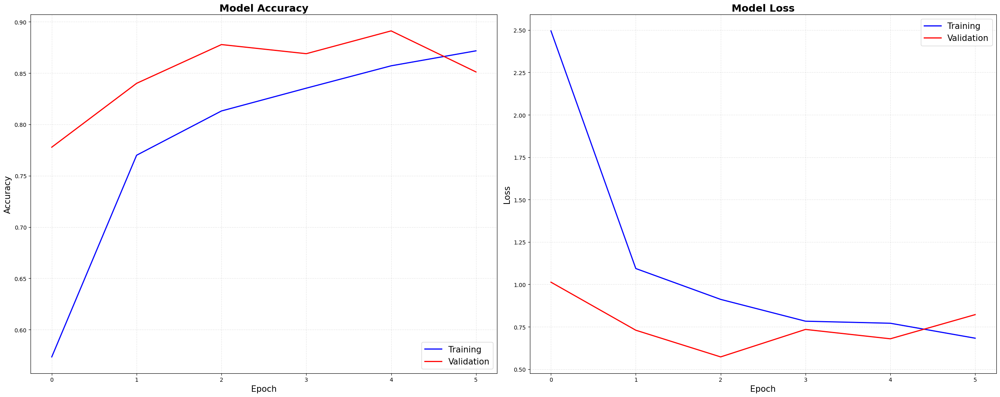

TRAINING SUMMARY
Total Epochs: 6
Best Validation Accuracy: 0.8911 (Epoch 5)
Best Validation Loss: 0.5724 (Epoch 3)
Final Training Accuracy: 0.8717
Final Validation Accuracy: 0.8511


In [26]:
# The training function returned these variables
# They should still be in your notebook memory
try:
    print(f"Training accuracies available: {len(training_accuracies)} epochs")
    print(f"Validation accuracies available: {len(val_accuracies)} epochs")

    # Plot using the variables directly
    import matplotlib.pyplot as plt

    # Convert to regular Python floats
    train_acc = [acc.cpu().item() if hasattr(acc, 'cpu') else acc for acc in training_accuracies]
    val_acc = [acc.cpu().item() if hasattr(acc, 'cpu') else acc for acc in val_accuracies]
    train_loss = [loss if isinstance(loss, float) else loss for loss in training_losses]
    val_loss = [loss if isinstance(loss, float) else loss for loss in val_losses]

    # Create plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

    # Accuracy plot
    ax1.plot(train_acc, 'b-', linewidth=2, label='Training')
    ax1.plot(val_acc, 'r-', linewidth=2, label='Validation')
    ax1.set_title('Model Accuracy', fontsize=18, fontweight='bold')
    ax1.set_xlabel('Epoch', fontsize=15)
    ax1.set_ylabel('Accuracy', fontsize=15)
    ax1.legend(loc='lower right', fontsize=15)
    ax1.grid(True, alpha=0.3, linestyle='--')

    # Loss plot
    ax2.plot(train_loss, 'b-', linewidth=2, label='Training')
    ax2.plot(val_loss, 'r-', linewidth=2, label='Validation')
    ax2.set_title('Model Loss', fontsize=18, fontweight='bold')
    ax2.set_xlabel('Epoch', fontsize=15)
    ax2.set_ylabel('Loss', fontsize=15)
    ax2.legend(loc='upper right', fontsize=15)
    ax2.grid(True, alpha=0.3, linestyle='--')

    plt.tight_layout()
    plt.show()

    # Summary
    print('='*60)
    print('TRAINING SUMMARY')
    print('='*60)
    print(f'Total Epochs: {len(train_acc)}')
    print(f'Best Validation Accuracy: {max(val_acc):.4f} (Epoch {val_acc.index(max(val_acc))+1})')
    print(f'Best Validation Loss: {min(val_loss):.4f} (Epoch {val_loss.index(min(val_loss))+1})')
    print(f'Final Training Accuracy: {train_acc[-1]:.4f}')
    print(f'Final Validation Accuracy: {val_acc[-1]:.4f}')
    print('='*60)

except NameError as e:
    print(f"❌ Variables not found: {e}")
    print("\nThe training variables are not in memory anymore.")
    print("You'll need to retrain using the optimized train_model function.")

### Training and Validation Plots

In [27]:
def plot_history(history_data=None, model_path='model/net_wnb.pth'):
    """
    Plot training history from either:
    1. Passed history_data dictionary
    2. Loaded from saved model file
    3. Global variables (backward compatibility)
    """

    # Try to get history from different sources
    if history_data is None:
        try:
            # Try loading from saved model
            checkpoint = torch.load(model_path, map_location='cpu')
            if 'history' in checkpoint:
                history_data = checkpoint['history']
                print('Loaded history from saved model file')
            else:
                print('No history found in checkpoint, using global variables')
                history_data = None
        except Exception as e:
            print(f'Could not load from file: {e}')
            print('Trying to use global variables...')
            history_data = None

    # Extract data from history_data or global variables
    if history_data is not None:
        train_acc = history_data['training_accuracies']
        val_acc = history_data['val_accuracies']
        train_loss = history_data['training_losses']
        val_loss = history_data['val_losses']
    else:
        # Fallback to global variables (must exist)
        try:
            train_acc = [acc.cpu().detach().numpy() if hasattr(acc, 'cpu') else acc for acc in training_accuracies]
            val_acc = [acc.cpu().detach().numpy() if hasattr(acc, 'cpu') else acc for acc in val_accuracies]
            train_loss = [loss.cpu().detach().numpy() if hasattr(loss, 'cpu') else loss for loss in training_losses]
            val_loss = [loss.cpu().detach().numpy() if hasattr(loss, 'cpu') else loss for loss in val_losses]
        except NameError:
            print('ERROR: No history data found!')
            print('Please either:')
            print('  1. Train the model first')
            print('  2. Load a saved model with history')
            print('  3. Pass history_data parameter')
            return

    # Create the plot
    fig = plt.figure(figsize=(25,10))

    # Summarize history for accuracy
    plt.subplot(1, 2, 1)
    plt.plot(range(len(train_acc)), train_acc, 'b-', linewidth=2, label='Training')
    plt.plot(range(len(val_acc)), val_acc, 'r-', linewidth=2, label='Validation')
    plt.title('Model Accuracy', fontsize=18, fontweight='bold')
    plt.ylabel('Accuracy', fontsize=15)
    plt.xlabel('Epoch', fontsize=15)
    plt.legend(loc='lower right', fontsize=15)
    plt.grid(True, alpha=0.3, linestyle='--')

    # Add min/max annotations
    max_val_acc_idx = val_acc.index(max(val_acc))
    plt.annotate(f'Best: {max(val_acc):.4f}',
                xy=(max_val_acc_idx, max(val_acc)),
                xytext=(10, -10), textcoords='offset points',
                bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.7),
                arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))

    # Summarize history for loss
    plt.subplot(1, 2, 2)
    plt.plot(range(len(train_loss)), train_loss, 'b-', linewidth=2, label='Training')
    plt.plot(range(len(val_loss)), val_loss, 'r-', linewidth=2, label='Validation')
    plt.title('Model Loss', fontsize=18, fontweight='bold')
    plt.ylabel('Loss', fontsize=15)
    plt.xlabel('Epoch', fontsize=15)
    plt.legend(loc='upper right', fontsize=15)
    plt.grid(True, alpha=0.3, linestyle='--')

    # Add min loss annotation
    min_val_loss_idx = val_loss.index(min(val_loss))
    plt.annotate(f'Best: {min(val_loss):.4f}',
                xy=(min_val_loss_idx, min(val_loss)),
                xytext=(10, 10), textcoords='offset points',
                bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.7),
                arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))

    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print('\n' + '='*60)
    print('TRAINING SUMMARY')
    print('='*60)
    print(f'Total Epochs: {len(train_acc)}')
    print(f'Best Validation Accuracy: {max(val_acc):.4f} (Epoch {max_val_acc_idx+1})')
    print(f'Best Validation Loss: {min(val_loss):.4f} (Epoch {min_val_loss_idx+1})')
    print(f'Final Training Accuracy: {train_acc[-1]:.4f}')
    print(f'Final Validation Accuracy: {val_acc[-1]:.4f}')
    print('='*60)

Loaded history from saved model file


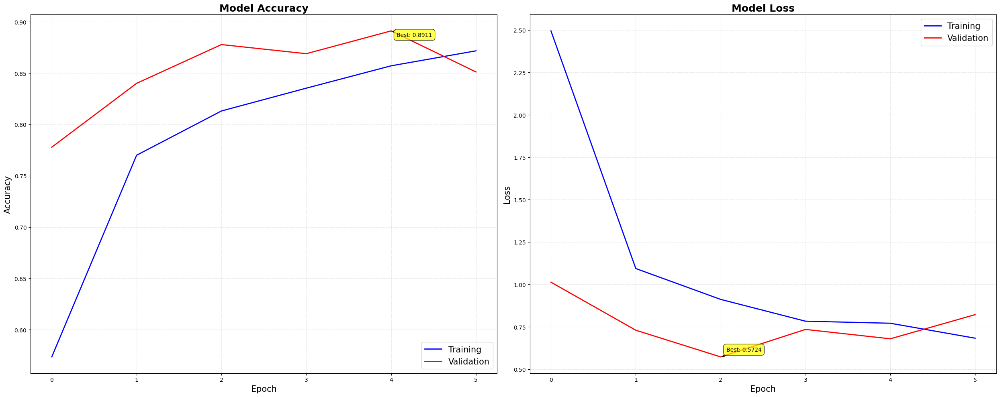


TRAINING SUMMARY
Total Epochs: 6
Best Validation Accuracy: 0.8911 (Epoch 5)
Best Validation Loss: 0.5724 (Epoch 3)
Final Training Accuracy: 0.8717
Final Validation Accuracy: 0.8511


In [28]:
plot_history()

### Visualise model predictions

In [29]:
def visualize_model(model, data_loader, num_images=25):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(25, 30))

    fig.canvas.draw()

    rows = 5
    columns = 5

    MEAN = torch.tensor([0.485, 0.456, 0.406])
    STD = torch.tensor([0.229, 0.224, 0.225])

    with torch.no_grad():

        for i, (inputs, labels) in enumerate(data_loader):
            inputs = inputs.to(device)

            outputs = model(inputs)
            val, preds = torch.max(outputs, 1)

            preds_invtrans = le.inverse_transform(preds.cpu())

            labels_invtrans = le.inverse_transform(labels.cpu())

            ax = []
            for j in range(inputs.size()[0]):
                images_so_far +=1
                ax.append(plt.subplot(rows, columns, images_so_far))

                # Reverse normalize
                image = inputs.cpu().data[j] * STD[:, None, None] + MEAN[:, None, None]

                image = image.permute(1, 2, 0)

                ax[-1].set_title(f'Ground Truth: {labels_invtrans[j]}\nPredicted: {preds_invtrans[j]}', fontsize=15, fontweight='bold')

                # Draw boxes around subplots
                bbox = ax[-1].get_tightbbox(fig.canvas.renderer)
                x0, y0, width, height = bbox.transformed(fig.transFigure.inverted()).bounds

                # slightly increase the very tight bounds:
                xpad = 0.01 * width
                ypad = 0.01 * height

                if preds[j] == labels[j]:
                     fig.add_artist(plt.Rectangle((x0-xpad, y0-ypad), width+2*xpad, height+2*ypad, edgecolor='green', linewidth=5, fill=False))
                else:
                     fig.add_artist(plt.Rectangle((x0-xpad, y0-ypad), width+2*xpad, height+2*ypad, edgecolor='red', linewidth=5, fill=False))

                plt.imshow(image)
                plt.axis('off')

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return

        model.train(mode=was_training)


Loaded model (new format with history)
Model loaded successfully on cuda


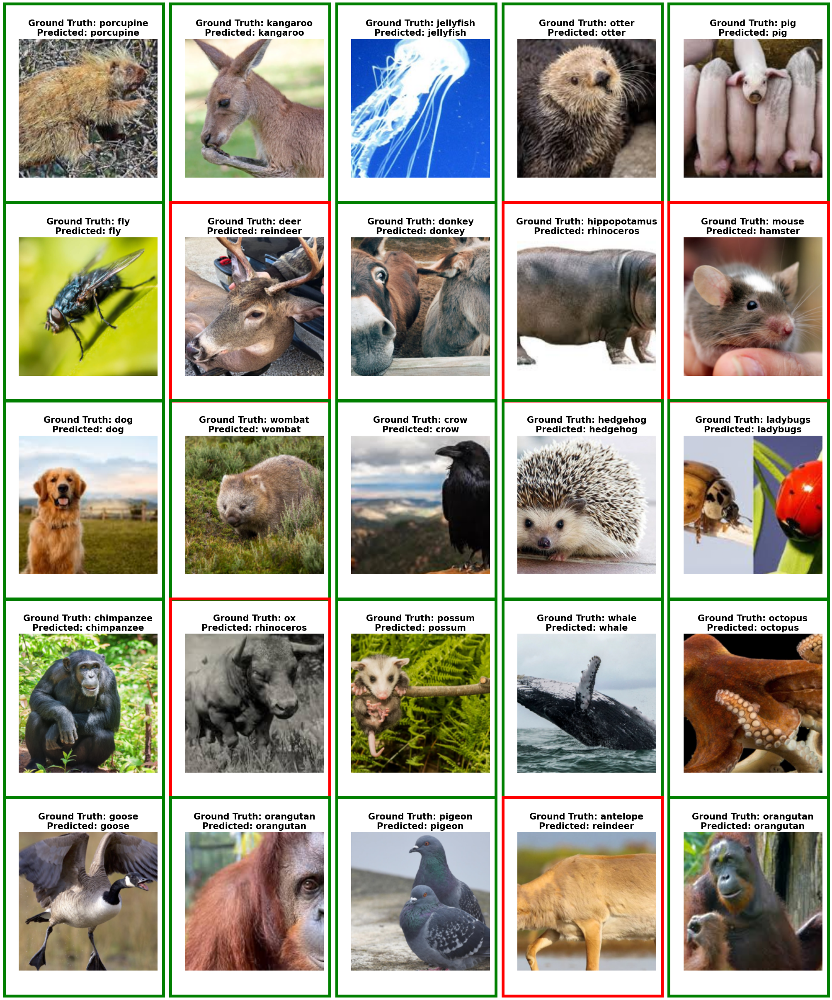

In [30]:
model = NeuralNet()

# Load model with CPU/GPU compatibility
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint = torch.load('model/net_wnb.pth', map_location=device)

# Handle both old and new checkpoint formats
if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
    # New format (with history)
    model.load_state_dict(checkpoint['model_state_dict'])
    print("Loaded model (new format with history)")
else:
    # Old format (just state_dict)
    model.load_state_dict(checkpoint)
    print("Loaded model (old format)")

model = model.to(device)
model.eval()

print(f'Model loaded successfully on {device}')

visualize_model(model, val_loader)

### Test Set

In [31]:
# ============================================
# Additional imports for comprehensive evaluation
# ============================================
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    precision_recall_fscore_support
)
import pandas as pd
import seaborn as sns

In [32]:
labels_list = []
preds_list = []
with torch.no_grad():
    for inputs, labels in tqdm(test_loader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        labels_list.extend(label.item() for label in labels)

        outputs = model_ft(inputs)

        predictions = torch.argmax(outputs, dim=1)

        preds_list.extend(prediction.item() for prediction in predictions)


count = 0
for i in range(len(preds_list)):
    if preds_list[i] == labels_list[i]:
        count += 1

accuracy = count / len(preds_list)
print(f'Test accuracy = {accuracy:.4f}')

  0%|          | 0/12 [00:00<?, ?it/s]

Test accuracy = 0.8500


In [33]:
# ============================================
# Comprehensive Test Set Evaluation Function
# ============================================
def evaluate_test_set(model, test_loader, device, class_names):
    """
    Comprehensive test set evaluation with confusion matrix and per-class metrics
    """
    model.eval()

    all_labels = []
    all_preds = []

    print("Evaluating model on test set...")
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc="Testing"):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Get predictions
            outputs = model(inputs)
            predictions = torch.argmax(outputs, dim=1)

            # Store labels and predictions
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predictions.cpu().numpy())

    # Convert to numpy arrays
    all_labels = np.array(all_labels)
    all_preds = np.array(all_preds)

    # Calculate overall accuracy
    overall_accuracy = accuracy_score(all_labels, all_preds)

    # Calculate per-class metrics
    precision, recall, f1, support = precision_recall_fscore_support(
        all_labels, all_preds, average=None, zero_division=0
    )

    # Generate confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    # Generate classification report
    class_report = classification_report(
        all_labels, all_preds,
        target_names=class_names,
        zero_division=0
    )

    results = {
        'accuracy': overall_accuracy,
        'confusion_matrix': cm,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'support': support,
        'classification_report': class_report,
        'predictions': all_preds,
        'labels': all_labels
    }

    return results

In [34]:
# ============================================
# Confusion Matrix Visualization Function
# ============================================
def plot_confusion_matrix(cm, class_names, figsize=(25, 20), normalize=False):
    """
    Plot confusion matrix as a heatmap
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        fmt = '.2f'
        title = 'Normalized Confusion Matrix'
    else:
        fmt = 'd'
        title = 'Confusion Matrix'

    plt.figure(figsize=figsize)
    sns.heatmap(
        cm,
        annot=False,  # Too many classes to annotate
        fmt=fmt,
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names,
        cbar_kws={'label': 'Count' if not normalize else 'Proportion'}
    )

    plt.title(title, fontsize=16, fontweight='bold')
    plt.ylabel('True Label', fontsize=14)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(rotation=90, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.tight_layout()
    plt.show()

In [35]:
# ============================================
# Per-Class Metrics Visualization Function
# ============================================
def plot_per_class_metrics(precision, recall, f1, support, class_names, top_n=20):
    """
    Plot per-class metrics as bar charts
    """
    # Create DataFrame
    metrics_df = pd.DataFrame({
        'Class': class_names,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Support': support
    })

    # Sort by F1-score
    metrics_df = metrics_df.sort_values('F1-Score', ascending=False)

    # Create 4-panel visualization
    fig, axes = plt.subplots(2, 2, figsize=(20, 12))

    # Panel 1: All classes F1-Score
    ax1 = axes[0, 0]
    colors = ['green' if x >= 0.9 else 'orange' if x >= 0.7 else 'red'
              for x in metrics_df['F1-Score']]
    ax1.barh(range(len(metrics_df)), metrics_df['F1-Score'], color=colors, alpha=0.7)
    ax1.set_yticks(range(len(metrics_df)))
    ax1.set_yticklabels(metrics_df['Class'], fontsize=6)
    ax1.set_xlabel('F1-Score', fontsize=12)
    ax1.set_title('F1-Score by Class (Sorted)', fontsize=14, fontweight='bold')
    ax1.axvline(x=0.9, color='green', linestyle='--', alpha=0.5, label='0.9 threshold')
    ax1.grid(axis='x', alpha=0.3)
    ax1.legend()

    # Panel 2: Top performers
    ax2 = axes[0, 1]
    top_classes = metrics_df.head(top_n)
    x = np.arange(len(top_classes))
    width = 0.25

    ax2.bar(x - width, top_classes['Precision'], width, label='Precision', alpha=0.8)
    ax2.bar(x, top_classes['Recall'], width, label='Recall', alpha=0.8)
    ax2.bar(x + width, top_classes['F1-Score'], width, label='F1-Score', alpha=0.8)
    ax2.set_xlabel('Class', fontsize=12)
    ax2.set_ylabel('Score', fontsize=12)
    ax2.set_title(f'Top {top_n} Classes by F1-Score', fontsize=14, fontweight='bold')
    ax2.set_xticks(x)
    ax2.set_xticklabels(top_classes['Class'], rotation=90, ha='right', fontsize=8)
    ax2.legend()
    ax2.grid(axis='y', alpha=0.3)

    # Panel 3: Bottom performers
    ax3 = axes[1, 0]
    bottom_classes = metrics_df.tail(top_n)
    x = np.arange(len(bottom_classes))

    ax3.bar(x - width, bottom_classes['Precision'], width, label='Precision', alpha=0.8)
    ax3.bar(x, bottom_classes['Recall'], width, label='Recall', alpha=0.8)
    ax3.bar(x + width, bottom_classes['F1-Score'], width, label='F1-Score', alpha=0.8)
    ax3.set_xlabel('Class', fontsize=12)
    ax3.set_ylabel('Score', fontsize=12)
    ax3.set_title(f'Bottom {top_n} Classes by F1-Score', fontsize=14, fontweight='bold')
    ax3.set_xticks(x)
    ax3.set_xticklabels(bottom_classes['Class'], rotation=90, ha='right', fontsize=8)
    ax3.legend()
    ax3.grid(axis='y', alpha=0.3)

    # Panel 4: Distribution
    ax4 = axes[1, 1]
    metrics_df[['Precision', 'Recall', 'F1-Score']].boxplot(ax=ax4)
    ax4.set_ylabel('Score', fontsize=12)
    ax4.set_title('Metrics Distribution', fontsize=14, fontweight='bold')
    ax4.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    return metrics_df

In [36]:
# ============================================
# RUN COMPREHENSIVE TEST SET EVALUATION
# ============================================
print("="*80)
print("COMPREHENSIVE TEST SET EVALUATION")
print("="*80)

# Evaluate on test set
test_results = evaluate_test_set(model_ft, test_loader, device, classes)

# Print overall accuracy
print(f"\n{'='*80}")
print(f"Overall Test Accuracy: {test_results['accuracy']:.4f} ({test_results['accuracy']*100:.2f}%)")
print(f"{'='*80}\n")

# Print summary statistics
print("Summary Statistics:")
print(f"  Mean Precision: {test_results['precision'].mean():.4f}")
print(f"  Mean Recall: {test_results['recall'].mean():.4f}")
print(f"  Mean F1-Score: {test_results['f1_score'].mean():.4f}")
print(f"  Total Test Samples: {len(test_results['labels'])}")
print(f"  Correctly Classified: {(test_results['predictions'] == test_results['labels']).sum()}")
print(f"  Misclassified: {(test_results['predictions'] != test_results['labels']).sum()}\n")

COMPREHENSIVE TEST SET EVALUATION
Evaluating model on test set...


Testing:   0%|          | 0/12 [00:00<?, ?it/s]


Overall Test Accuracy: 0.8500 (85.00%)

Summary Statistics:
  Mean Precision: 0.9122
  Mean Recall: 0.8500
  Mean F1-Score: 0.8528
  Total Test Samples: 360
  Correctly Classified: 306
  Misclassified: 54



In [37]:
# ============================================
# Print Detailed Classification Report
# ============================================
print("\nDetailed Classification Report:")
print("="*80)
print(test_results['classification_report'])


Detailed Classification Report:
                precision    recall  f1-score   support

      antelope       1.00      0.25      0.40         4
        badger       1.00      0.75      0.86         4
           bat       0.75      0.75      0.75         4
          bear       1.00      0.75      0.86         4
           bee       1.00      1.00      1.00         4
        beetle       0.75      0.75      0.75         4
         bison       1.00      1.00      1.00         4
          boar       0.67      0.50      0.57         4
     butterfly       1.00      1.00      1.00         4
           cat       1.00      1.00      1.00         4
   caterpillar       1.00      1.00      1.00         4
    chimpanzee       1.00      1.00      1.00         4
     cockroach       0.80      1.00      0.89         4
           cow       1.00      0.75      0.86         4
        coyote       0.80      1.00      0.89         4
          crab       1.00      1.00      1.00         4
          crow


Generating Confusion Matrix...



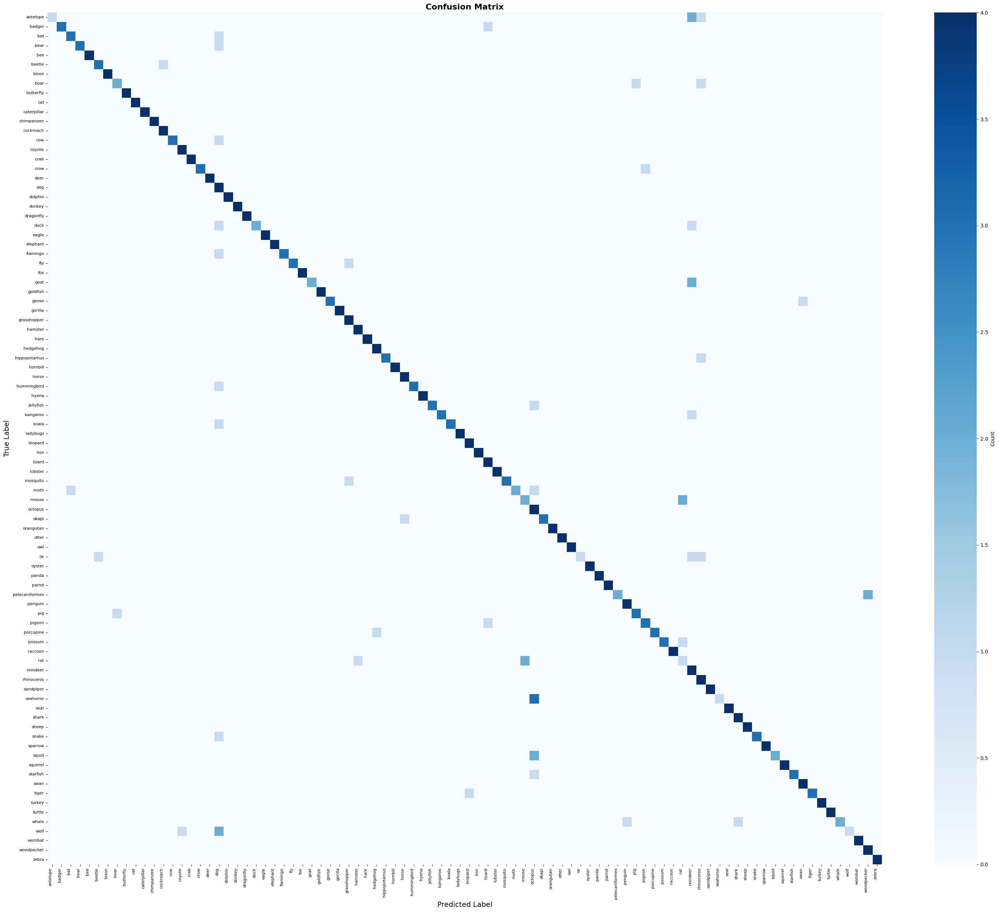

In [38]:
# ============================================
# Confusion Matrix Visualization
# ============================================
print("\nGenerating Confusion Matrix...\n")
plot_confusion_matrix(
    test_results['confusion_matrix'],
    classes,
    figsize=(30, 25),
    normalize=False
)


Generating Normalized Confusion Matrix...



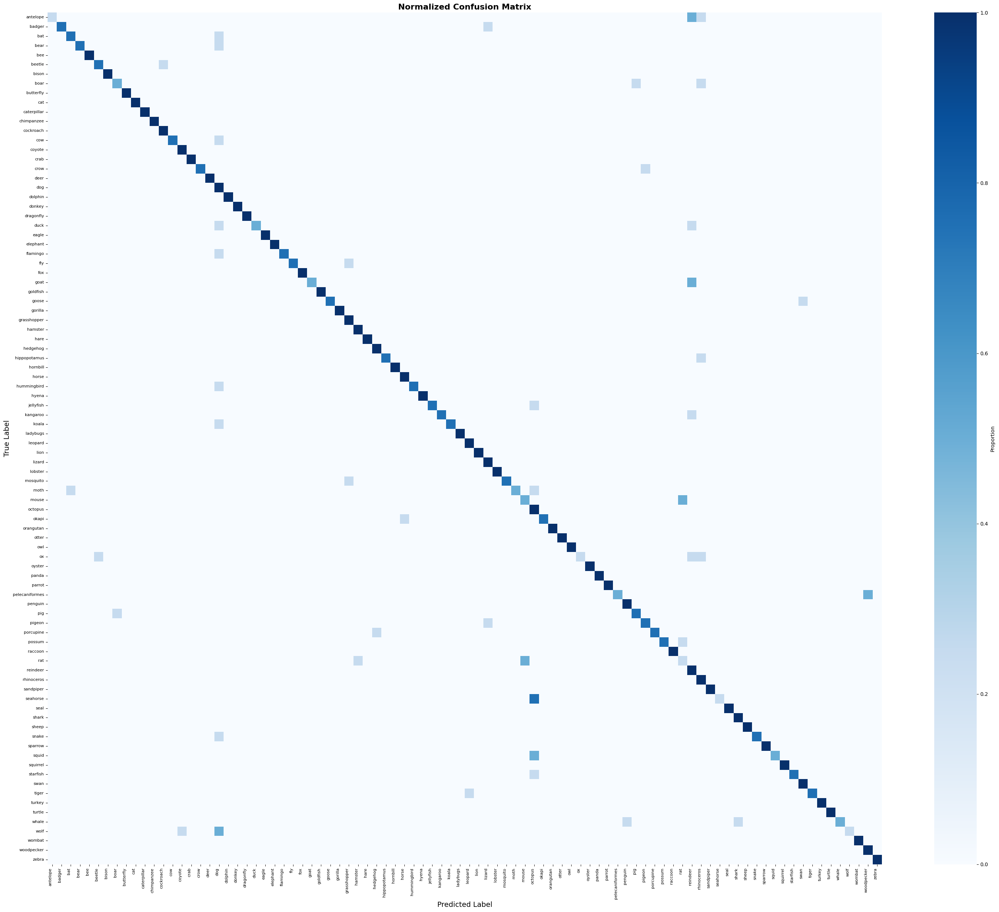

In [39]:
# ============================================
# Normalized Confusion Matrix
# ============================================
print("\nGenerating Normalized Confusion Matrix...\n")
plot_confusion_matrix(
    test_results['confusion_matrix'],
    classes,
    figsize=(30, 25),
    normalize=True
)


Generating Per-Class Metrics Visualizations...



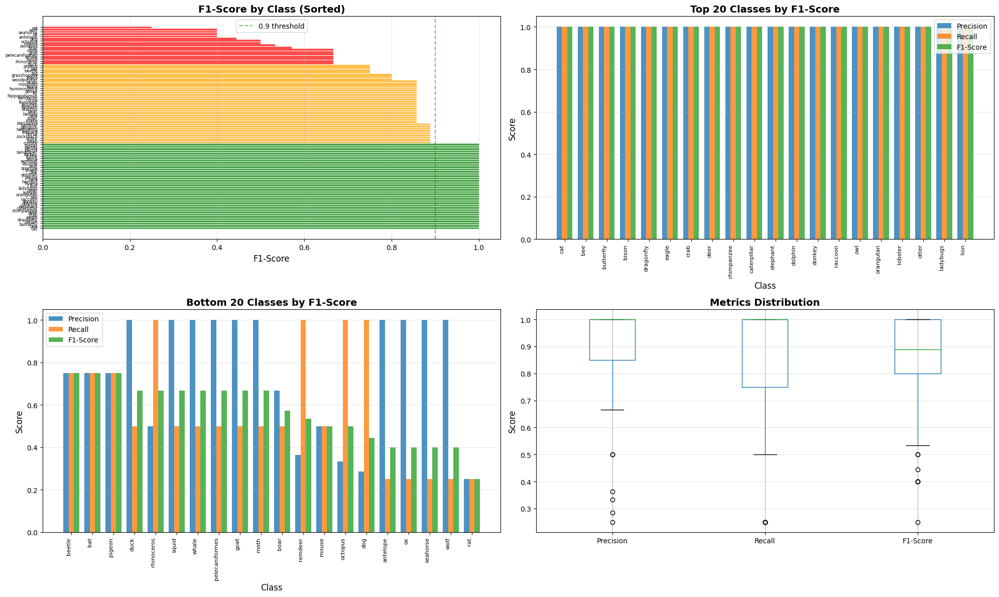

In [40]:
# ============================================
# Per-Class Metrics Visualization
# ============================================
print("\nGenerating Per-Class Metrics Visualizations...\n")
metrics_df = plot_per_class_metrics(
    test_results['precision'],
    test_results['recall'],
    test_results['f1_score'],
    test_results['support'],
    classes,
    top_n=20
)

In [41]:
# ============================================
# Display Complete Metrics Table
# ============================================
print("\nComplete Per-Class Metrics Table:")
print("="*80)

# Sort by F1-Score
metrics_df_sorted = metrics_df.sort_values('F1-Score', ascending=False)

# Display as formatted table
display(metrics_df_sorted.style.format({
    'Precision': '{:.4f}',
    'Recall': '{:.4f}',
    'F1-Score': '{:.4f}',
    'Support': '{:.0f}'
}).background_gradient(
    subset=['Precision', 'Recall', 'F1-Score'],
    cmap='RdYlGn',
    vmin=0,
    vmax=1
))


Complete Per-Class Metrics Table:


,Class,Precision,Recall,F1-Score,Support
9,cat,1.0000,1.0000,1.0000,4
4,bee,1.0000,1.0000,1.0000,4
8,butterfly,1.0000,1.0000,1.0000,4
6,bison,1.0000,1.0000,1.0000,4
21,dragonfly,1.0000,1.0000,1.0000,4
23,eagle,1.0000,1.0000,1.0000,4
15,crab,1.0000,1.0000,1.0000,4
17,deer,1.0000,1.0000,1.0000,4
11,chimpanzee,1.0000,1.0000,1.0000,4
10,caterpillar,1.0000,1.0000,1.0000,4


In [42]:
# ============================================
# Analyze Best and Worst Performing Classes
# ============================================
print("\nWorst Performing Classes (Bottom 10 by F1-Score):")
print("="*80)
worst_classes = metrics_df.sort_values('F1-Score').head(10)
print(worst_classes[['Class', 'Precision', 'Recall', 'F1-Score', 'Support']].to_string(index=False))

print("\n\nBest Performing Classes (Top 10 by F1-Score):")
print("="*80)
best_classes = metrics_df.sort_values('F1-Score', ascending=False).head(10)
print(best_classes[['Class', 'Precision', 'Recall', 'F1-Score', 'Support']].to_string(index=False))


Worst Performing Classes (Bottom 10 by F1-Score):
   Class  Precision  Recall  F1-Score  Support
     rat   0.250000    0.25  0.250000        4
antelope   1.000000    0.25  0.400000        4
seahorse   1.000000    0.25  0.400000        4
      ox   1.000000    0.25  0.400000        4
    wolf   1.000000    0.25  0.400000        4
     dog   0.285714    1.00  0.444444        4
   mouse   0.500000    0.50  0.500000        4
 octopus   0.333333    1.00  0.500000        4
reindeer   0.363636    1.00  0.533333        4
    boar   0.666667    0.50  0.571429        4


Best Performing Classes (Top 10 by F1-Score):
      Class  Precision  Recall  F1-Score  Support
        cat        1.0     1.0       1.0        4
        bee        1.0     1.0       1.0        4
  butterfly        1.0     1.0       1.0        4
      bison        1.0     1.0       1.0        4
  dragonfly        1.0     1.0       1.0        4
      eagle        1.0     1.0       1.0        4
       crab        1.0     1.0    

In [43]:
# ============================================
# Save All Results to Files
# ============================================
# Save per-class metrics to CSV
metrics_df.to_csv('test_results_per_class.csv', index=False)
print("\n✓ Per-class metrics saved to 'test_results_per_class.csv'")

# Save confusion matrix
np.savetxt('confusion_matrix.csv', test_results['confusion_matrix'], delimiter=',', fmt='%d')
print("✓ Confusion matrix saved to 'confusion_matrix.csv'")

# Save overall results summary
with open('test_evaluation_summary.txt', 'w') as f:
    f.write("="*80 + "\n")
    f.write("TEST SET EVALUATION SUMMARY\n")
    f.write("="*80 + "\n\n")
    f.write(f"Overall Test Accuracy: {test_results['accuracy']:.4f} ({test_results['accuracy']*100:.2f}%)\n")
    f.write(f"Mean Precision: {test_results['precision'].mean():.4f}\n")
    f.write(f"Mean Recall: {test_results['recall'].mean():.4f}\n")
    f.write(f"Mean F1-Score: {test_results['f1_score'].mean():.4f}\n")
    f.write(f"Total Test Samples: {len(test_results['labels'])}\n\n")
    f.write("="*80 + "\n")
    f.write("CLASSIFICATION REPORT\n")
    f.write("="*80 + "\n\n")
    f.write(test_results['classification_report'])

print("✓ Overall evaluation summary saved to 'test_evaluation_summary.txt'")
print("\nAll test evaluation results saved successfully!")


✓ Per-class metrics saved to 'test_results_per_class.csv'
✓ Confusion matrix saved to 'confusion_matrix.csv'
✓ Overall evaluation summary saved to 'test_evaluation_summary.txt'

✅ All test evaluation results saved successfully!


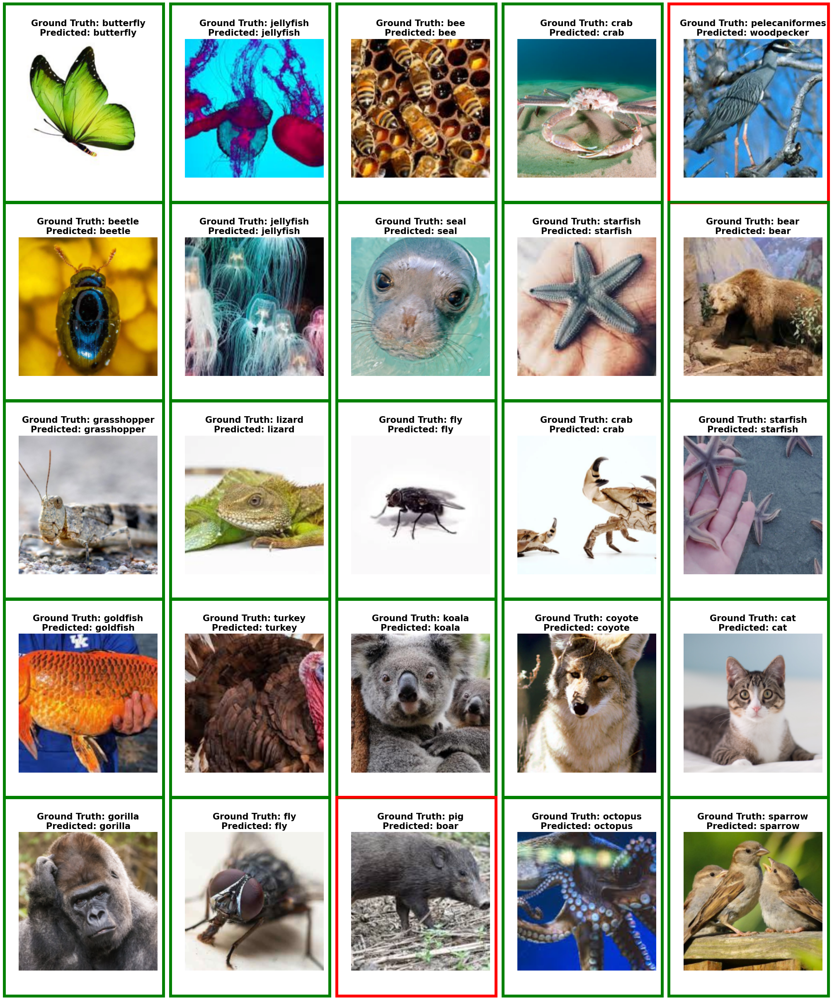

In [44]:
# Visualise predictions on test dataset
visualize_model(model_ft, test_loader)

## Predict single images



In [45]:
from PIL import Image
import requests
import json

model = NeuralNet()

# Load model with CPU/GPU compatibility (handles both formats)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint = torch.load('model/net_wnb.pth', map_location=device)

# Handle both old and new checkpoint formats
if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
    print("Loaded model (new format)")
else:
    model.load_state_dict(checkpoint)
    print("Loaded model (old format)")

model = model.to(device)
model.eval()

print(f'Model loaded successfully on {device}')

# Load classes
with open('animals/classes.json', 'r') as infile:
    data = json.loads(infile.read())
classes = data['classes']

def predict(model, url):
    model.eval()
    tfms = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),  # Use CenterCrop for inference (better than RandomCrop)
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    plt.figure(figsize=(5,5))

    image = Image.open(requests.get(url, stream=True).raw)
    img_tensor = tfms(image).to(device).unsqueeze(0)  # Use device, not 'cpu'

    with torch.no_grad():  # Add this for inference
        output = model(img_tensor)
        prediction = torch.argmax(output, dim=1)

    prediction = classes[prediction.item()]  # Use .item() to get scalar value

    plt.imshow(image)
    plt.title(prediction, fontsize=15)
    plt.axis('off')
    plt.show()

    return prediction

print("Predict function ready!")

Loaded model (new format)
Model loaded successfully on cuda
✓ Predict function ready!


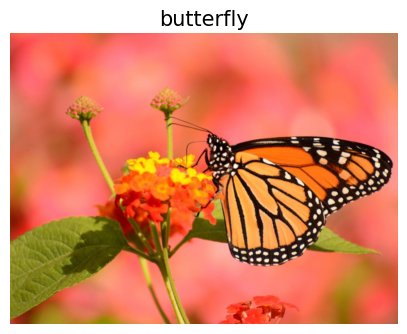

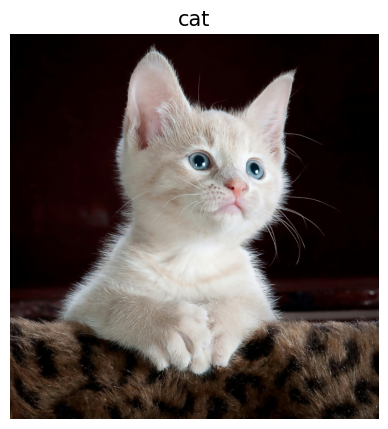

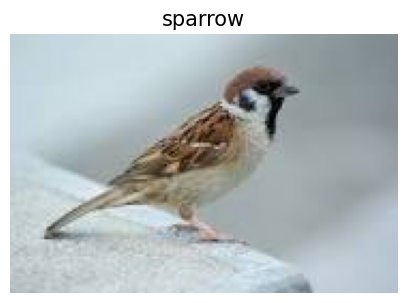

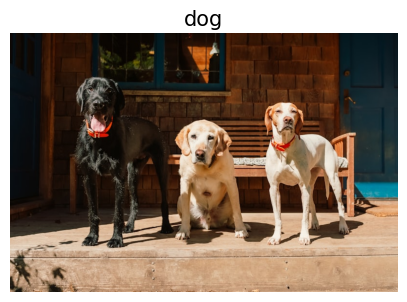

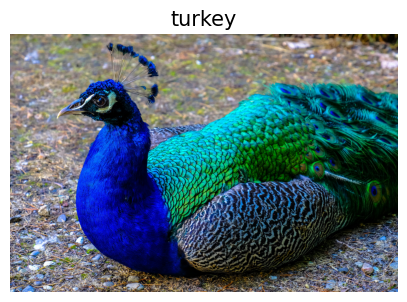

In [46]:
# Insert image address for single image prediction



url_list = [
    "https://www.gardeningknowhow.com/wp-content/uploads/2020/02/butterfly.jpg",
    "https://images.pexels.com/photos/45201/kitty-cat-kitten-pet-45201.jpeg?cs=srgb&dl=pexels-pixabay-45201.jpg&fm=jpg",
     "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRia3MH0-0puMFpmZsW074uMO8cCdrr56DERY-8iB9p&s",
     "https://plus.unsplash.com/premium_photo-1668114375111-e90b5e975df6?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8MXx8ZG9nc3xlbnwwfHwwfHw%3D&auto=format&fit=crop&w=800&q=60"
     "https://thumbs.dreamstime.com/b/african-elephant-isolated-white-8115112.jpg",
     "https://images.pexels.com/photos/409126/pexels-photo-409126.jpeg?cs=srgb&dl=pexels-francesco-ungaro-409126.jpg&fm=jpg",


]

for url in url_list:
    predict(model, url)

#### Predict animals that model have not been trained on

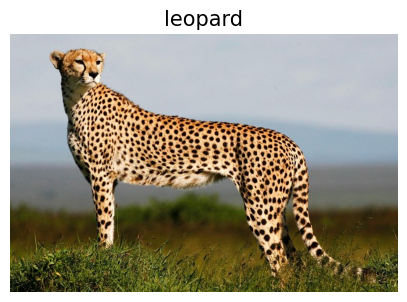

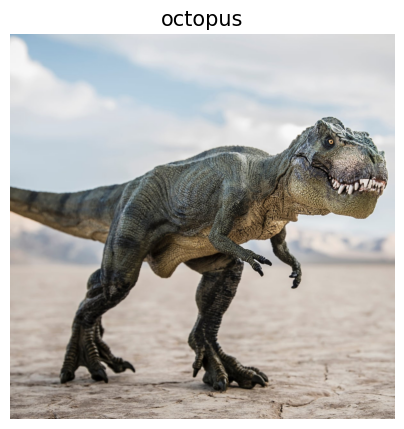

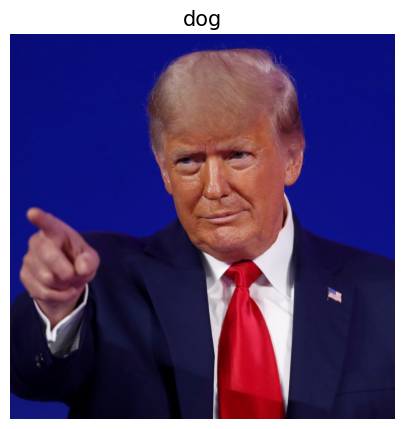

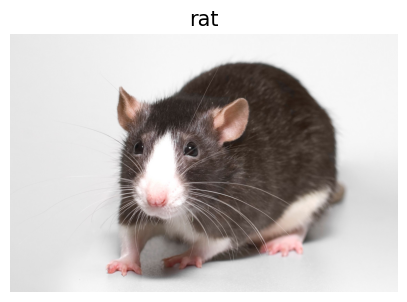

In [47]:
untrained_url_list = [
    "https://media.tacdn.com/media/attractions-splice-spp-674x446/06/6c/2e/d4.jpg",
    "https://i.guim.co.uk/img/media/5dab212de07d8009dd06560efeb1ac87b114e23d/0_640_4183_2510/master/4183.jpg?width=1200&height=1200&quality=85&auto=format&fit=crop&s=7c9461c31fb8530f24343e669d6730ba",
    "https://images.wsj.net/im-307680?width=1280&size=1",
     "https://media.wired.com/photos/5932599a26780e6c04d2b1a7/master/w_2560%2Cc_limit/rat1.jpg"
]

for url in untrained_url_list:
    predict(model, url)